V17: add TTA

# load packages

In [1]:
import os
from skimage.data import imread
from skimage.morphology import label
import pandas as pd
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
import random
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

input_dir = '/data2/cgp/airbus_ships/'
train_img_dir = '/data2/cgp/airbus_ships/train/'
test_img_dir = '/data2/cgp/airbus_ships/test/'

Using TensorFlow backend.


# load train_dataframe

In [2]:
train_df = pd.read_csv(input_dir+'train_ship_segmentations_v2.csv')

In [3]:
train_df.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [4]:
train_df.shape

(231723, 2)

# remove bug images

In [5]:
train_df = train_df[train_df['ImageId'] != '6384c3e78.jpg']

In [6]:
train_df.shape

(231722, 2)

# remove 100000 non-ship images

In [7]:
def area_isnull(x):
    if x == x:
        return 0
    else:
        return 1

In [8]:
train_df['isnan'] = train_df['EncodedPixels'].apply(area_isnull)

In [9]:
train_df['isnan'].value_counts()

1    149999
0     81723
Name: isnan, dtype: int64

In [10]:
train_df = train_df.sort_values('isnan', ascending=False)
train_df = train_df.iloc[100000:]

In [11]:
train_df['isnan'].value_counts()

0    81723
1    49999
Name: isnan, dtype: int64

# calculate ship area and group by ImageId

In [12]:
def rle_to_mask(rle_list, SHAPE):
    tmp_flat = np.zeros(SHAPE[0]*SHAPE[1])
    if len(rle_list) == 1:
        mask = np.reshape(tmp_flat, SHAPE).T
    else:
        strt = rle_list[::2]
        length = rle_list[1::2]
        for i,v in zip(strt,length):
            tmp_flat[(int(i)-1):(int(i)-1)+int(v)] = 255
        mask = np.reshape(tmp_flat, SHAPE).T
    return mask

In [13]:
def calc_area_for_rle(rle_str):
    rle_list = [int(x) if x.isdigit() else x for x in str(rle_str).split()]
    if len(rle_list) == 1:
        return 0
    else:
        area = np.sum(rle_list[1::2])
        return area

In [14]:
train_df['area'] = train_df['EncodedPixels'].apply(calc_area_for_rle)

get small area of one ship; If estimated area of the ship is less than 10, it is corrected to 0.

In [15]:
train_df_isship = train_df[train_df['area'] > 0]

In [16]:
train_df_isship.shape

(81723, 4)

In [17]:
train_df_smallarea = train_df_isship['area'][train_df_isship['area'] < 10]

In [18]:
train_df_smallarea.shape

(101,)

In [19]:
train_df_smallarea.shape[0]/train_df_isship.shape[0]

0.001235882187389107

In [20]:
train_gp = train_df.groupby('ImageId').sum()
train_gp = train_gp.reset_index()

In [21]:
train_gp.head()

,ImageId,isnan,area
0,000155de5.jpg,0,3388
1,000194a2d.jpg,0,1460
2,0001b1832.jpg,1,0
3,00021ddc3.jpg,0,1176
4,0002756f7.jpg,0,408


# set class of ship area

In [22]:
def calc_class(area):
    area = area / (768*768)
    if area == 0:
        return 0
    elif area < 0.005:
        return 1
    elif area < 0.015:
        return 2
    elif area < 0.025:
        return 3
    elif area < 0.035:
        return 4
    elif area < 0.045:
        return 5
    else:
        return 6

In [23]:
train_gp['class'] = train_gp['area'].apply(calc_class)

In [24]:
train_gp['class'].value_counts()

0    49999
1    29315
2     9225
3     2644
4     1122
5      181
6       69
Name: class, dtype: int64

# split train-set and validation-set (stratified: area class)

In [25]:
train, val = train_test_split(train_gp, test_size=0.01, stratify=train_gp['class'].tolist())

In [26]:
train_isship_list = train['ImageId'][train['isnan']==0].tolist()
train_isship_list = random.sample(train_isship_list, len(train_isship_list))
train_nanship_list = train['ImageId'][train['isnan']==1].tolist()
train_nanship_list = random.sample(train_nanship_list, len(train_nanship_list))

val_isship_list = val['ImageId'][val['isnan']==0].tolist()
val_nanship_list = val['ImageId'][val['isnan']==1].tolist()

In [27]:
len(train_isship_list),len(train_nanship_list)

(42130, 49499)

# create data generator
Make the ratio of is-ship images and nan-ship images  equal

In [28]:
from keras.preprocessing.image import ImageDataGenerator
dg_args = dict(featurewise_center = False, 
                  samplewise_center = False,
                  rotation_range = 15, 
                  width_shift_range = 0.1, 
                  height_shift_range = 0.1, 
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],  
                  horizontal_flip = True, 
                  vertical_flip = True,
                  brightness_range = [0.7, 1.3],
                  fill_mode = 'reflect',
                   data_format = 'channels_last')

image_gen = ImageDataGenerator(**dg_args)
label_gen = ImageDataGenerator(**dg_args)


def mygenerator(isship_list, nanship_list, batch_size, cap_num):
    train_img_names_nanship = nanship_list[:cap_num]
    train_img_names_isship = isship_list[:cap_num]
    k = 0
    while True:
        if k+batch_size//2 >= cap_num:
            k = 0
        batch_img_names_nan = train_img_names_nanship[k:k+batch_size//2]
        batch_img_names_is = train_img_names_isship[k:k+batch_size//2]
        batch_img = []
        batch_mask = []
        for name in batch_img_names_nan:
            tmp_img = imread(train_img_dir + name)
            batch_img.append(tmp_img)
            batch_mask.append(0)
        for name in batch_img_names_is:
            tmp_img = imread(train_img_dir + name)
            batch_img.append(tmp_img)
            batch_mask.append(1)
        img = np.stack(batch_img, axis=0)
        mask = np.stack(batch_mask, axis=0)

        g_x = image_gen.flow(img, mask,
                             batch_size = img.shape[0], 
                             shuffle=True,
                             seed=None)
        
        
        #print(type(g_x))
        
        #print(type(next(g_x)))
        
        imgaug, maskaug = next(g_x)
        
        k += batch_size//2
        #yield next(g_x)/ 255.0, next(g_y)
        yield imgaug/ 255.0, maskaug

In [29]:
BATCH_SIZE = 4
CAP_NUM = min(len(train_isship_list),len(train_nanship_list))
datagen = mygenerator(train_isship_list, train_nanship_list, batch_size=BATCH_SIZE, cap_num=CAP_NUM)
valgen = mygenerator(val_isship_list, val_nanship_list, batch_size=50, cap_num=CAP_NUM)

#aug_gen = create_aug_gen(valgen)

numvalimages = 50
val_x, val_y = next(valgen)
val_y


array([0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 0])

In [30]:
#import matplotlib.pyplot as plt
#%matplotlib inline
#for x, y in zip(val_x, val_y):
#    fig = plt.figure(figsize=(10,10))
#    plt.imshow(x)
#    plt.xlabel(y)

# set model
U-net with Hypercolumn

In [31]:
inputs = Input(shape=(768,768,3))

c1 = Conv2D(32, (3, 3), activation='relu', padding='same') (inputs)
p1 = MaxPooling2D((2, 2)) (c1)  # 384x384

c2 = Conv2D(64, (3, 3), activation='relu', padding='same') (p1)
p2 = MaxPooling2D((2, 2)) (c2)  # 192x192

c3 = Conv2D(128, (3, 3), activation='relu', padding='same') (p2)
p3 = MaxPooling2D((2, 2)) (c3)  # 96x96

c4 = Conv2D(256, (3, 3), activation='relu', padding='same') (p3)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)  # 48x48

c5 = Conv2D(512, (3, 3), activation='relu', padding='same') (p4)
p5 = MaxPooling2D(pool_size=(2, 2)) (c5) # 24x24

c6 = Conv2D(512, (3, 3), activation='relu', padding='same') (p5)
p6 = MaxPooling2D(pool_size=(2, 2)) (c6) # 12x12

c7 = Conv2D(512, (3, 3), activation='relu', padding='same') (p6)
p7 = MaxPooling2D(pool_size=(2, 2)) (c7) # 6x6

flatp7 = Flatten() (p7)
d1 = Dense(128, activation='relu') (flatp7)
d2 = Dense(1, activation='sigmoid') (d1)

model = Model(inputs=[inputs], outputs=[d2])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 768, 768, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 768, 768, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 384, 384, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 384, 384, 64)      18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 192, 192, 64)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 192, 192, 128)     73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 96, 96, 128)       0         
__________

In [32]:
from keras.callbacks import Callback, TensorBoard, ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau
import math, shutil

def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def dice_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def IoU(y_true, y_pred, eps=1e-6):
    if np.max(y_true) == 0.0:
        return IoU(1-y_true, 1-y_pred) ## empty image; calc IoU of zeros
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3]) - intersection
    return -K.mean( (intersection + eps) / (union + eps), axis=0)

reduceLROnPlat = ReduceLROnPlateau(monitor='loss', factor=0.7, 
                                   patience=10, 
                                   verbose=1, mode='max', epsilon=0.0001, cooldown=2, min_lr=1e-6)


if os.path.exists('./log'):
    shutil.rmtree('./log')


tb_callback = TensorBoard(log_dir='./log', histogram_freq=0,  
          write_graph=True, write_images=True)

callbacks_list = [tb_callback, reduceLROnPlat]

NUM_EPOCHS = 100

model.compile(optimizer=Adam(1e-4, decay=0.0), loss='binary_crossentropy', metrics=['acc'])

/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/keras/callbacks.py:1065: UserWarning: `epsilon` argument is deprecated and will be removed, use `min_delta` instead.
  warnings.warn('`epsilon` argument is deprecated and '


# training

In [33]:
history = model.fit_generator(datagen, steps_per_epoch = 250, epochs = NUM_EPOCHS, callbacks=callbacks_list,
                             validation_data=(val_x, val_y))

Epoch 1/100
250/250 [==============================] - 191s 762ms/step - loss: 0.6146 - acc: 0.6630 - val_loss: 0.4798 - val_acc: 0.7800
Epoch 2/100
250/250 [==============================] - 169s 676ms/step - loss: 0.5634 - acc: 0.6940 - val_loss: 0.5299 - val_acc: 0.6800
Epoch 3/100
250/250 [==============================] - 206s 823ms/step - loss: 0.5577 - acc: 0.7060 - val_loss: 0.4096 - val_acc: 0.7600
Epoch 4/100
250/250 [==============================] - 208s 831ms/step - loss: 0.5517 - acc: 0.7110 - val_loss: 0.4299 - val_acc: 0.7400
Epoch 5/100
250/250 [==============================] - 188s 753ms/step - loss: 0.5517 - acc: 0.7110 - val_loss: 0.3880 - val_acc: 0.8000
Epoch 6/100
250/250 [==============================] - 180s 718ms/step - loss: 0.5100 - acc: 0.7500 - val_loss: 0.3888 - val_acc: 0.7600
Epoch 7/100
250/250 [==============================] - 180s 719ms/step - loss: 0.5154 - acc: 0.7270 - val_loss: 0.3800 - val_acc: 0.8000
Epoch 8/100
250/250 [====================

250/250 [==============================] - 165s 662ms/step - loss: 0.2445 - acc: 0.8980 - val_loss: 0.1527 - val_acc: 0.9600
Epoch 58/100
250/250 [==============================] - 166s 666ms/step - loss: 0.2751 - acc: 0.9080 - val_loss: 0.1471 - val_acc: 0.9800
Epoch 59/100
250/250 [==============================] - 166s 663ms/step - loss: 0.2470 - acc: 0.9060 - val_loss: 0.1419 - val_acc: 0.9800
Epoch 60/100
250/250 [==============================] - 165s 659ms/step - loss: 0.2309 - acc: 0.9120 - val_loss: 0.1541 - val_acc: 0.9600
Epoch 61/100
250/250 [==============================] - 165s 661ms/step - loss: 0.2472 - acc: 0.9030 - val_loss: 0.1315 - val_acc: 0.9800
Epoch 62/100
250/250 [==============================] - 165s 662ms/step - loss: 0.2340 - acc: 0.9150 - val_loss: 0.1466 - val_acc: 0.9800
Epoch 63/100
250/250 [==============================] - 166s 664ms/step - loss: 0.2373 - acc: 0.9050 - val_loss: 0.1264 - val_acc: 0.9600
Epoch 64/100
250/250 [=========================

In [34]:
#with open('seg_model_hypercolumn.json', 'w')
#model.to_json('seg_model_hypercolumn.json')
model.save('seg_model_ship_classifier.h5')
#model.save_weights('weights.h5')

# calculate F2 score for validation set

In [37]:
val_list = val['ImageId'].tolist()
train_list = train['ImageId'].tolist()

In [38]:
def create_data(image_list):
    batch_img = []
    batch_mask = []
    for name in image_list:
        tmp_img = imread(train_img_dir + name)
        batch_img.append(tmp_img)
        mask_list = train_df['EncodedPixels'][train_df['ImageId'] == name].tolist()
        one_mask = np.zeros((768, 768, 1))
        for item in mask_list:
            rle_list = str(item).split()
            tmp_mask = rle_to_mask(rle_list, (768, 768))
            one_mask[:,:,0] += tmp_mask
        if np.any(one_mask):
            batch_mask.append(1)
        else:
            batch_mask.append(0)
    img = np.stack(batch_img, axis=0)
    mask = np.stack(batch_mask, axis=0)
    img = img / 255.0
    return img, mask

- put it together and search optimal threshold

# visualize predict images
display 5 images

In [39]:
import matplotlib.pyplot as plt
%matplotlib inline

/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/matplotlib/text.py:1191: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


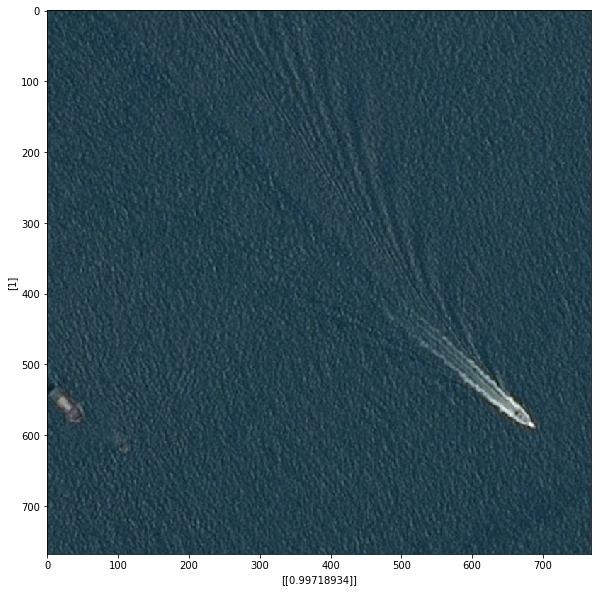

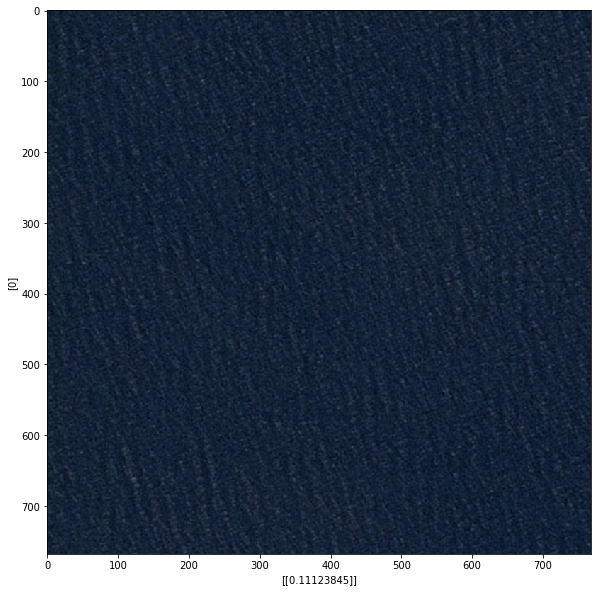

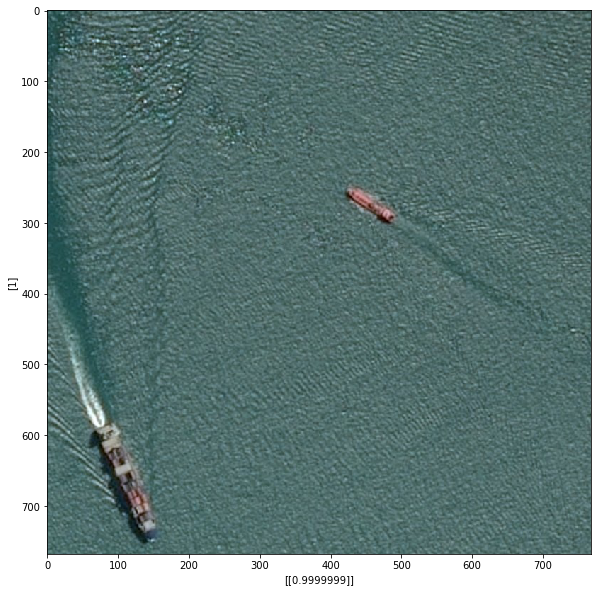

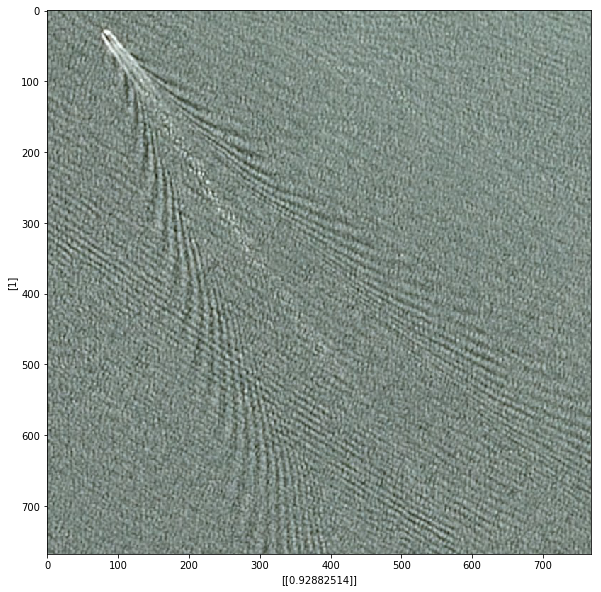

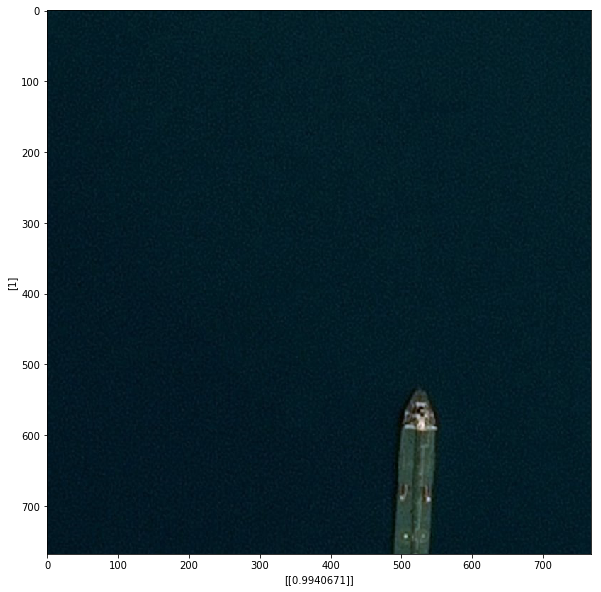

...

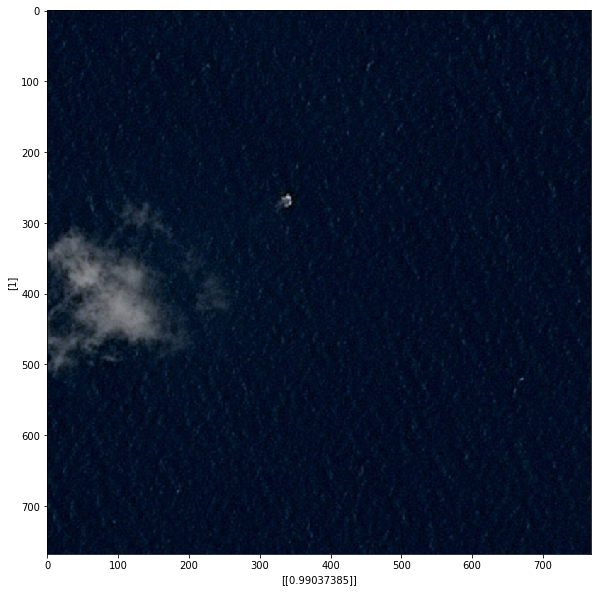

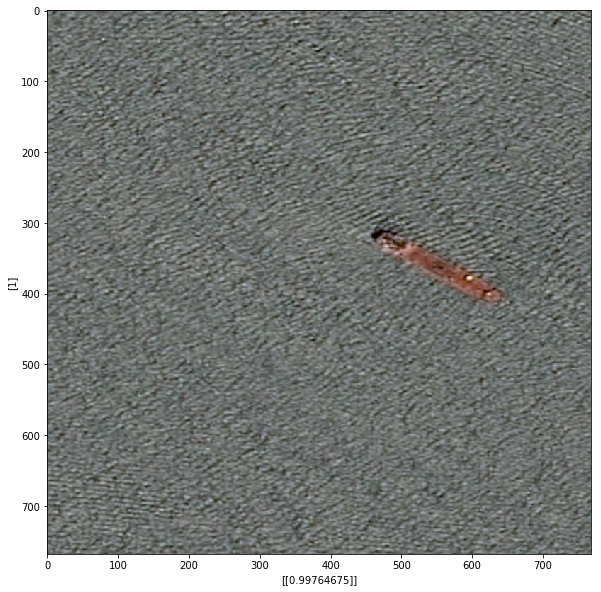

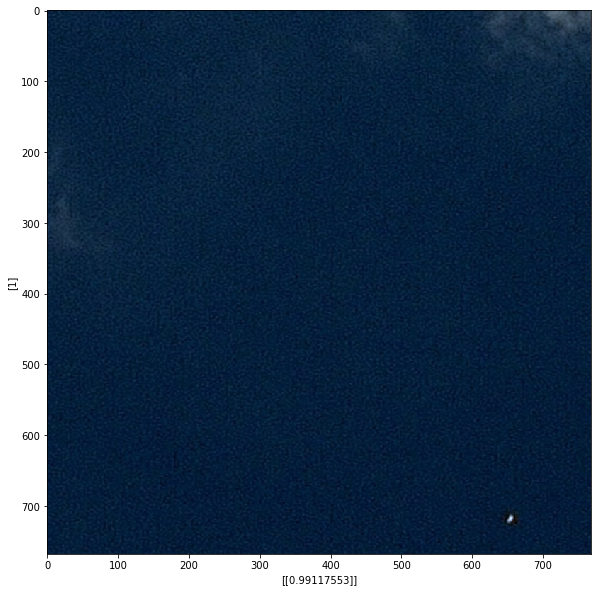

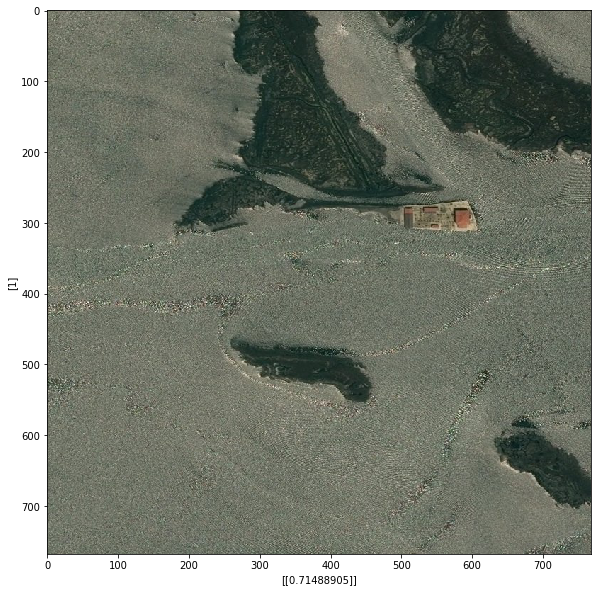

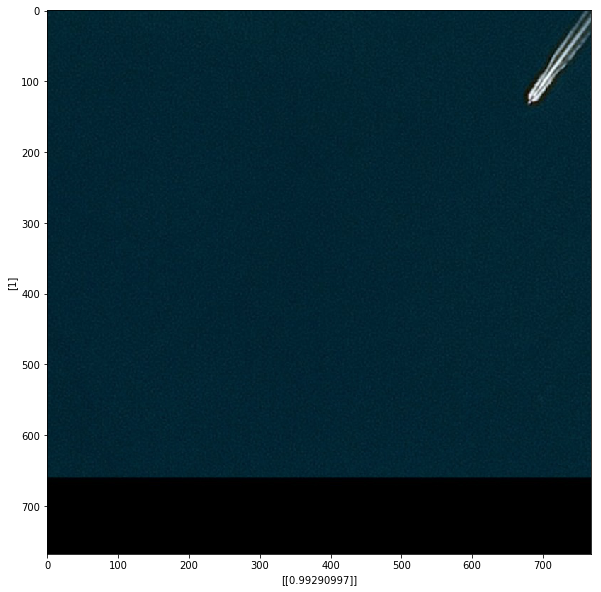

In [40]:
image_list = val_list[0:30]

for i in range(len(image_list)):
    img = imread(train_img_dir + image_list[i])
    input_img, gt_mask = create_data([image_list[i]])
    pred_mask = model.predict(input_img)
    #print(pred_mask, gt_mask)
    #print(img.shape, input_img.shape)
    fig = plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.xlabel(pred_mask)
    plt.ylabel(gt_mask)
    

In [50]:
from tqdm import tqdm
image_list = val_isship_list
num_actual_images_with_ships = len(image_list)
cnt = 0
for i in tqdm(range(len(image_list))):
    img = imread(train_img_dir + image_list[i])
    input_img, gt_mask = create_data([image_list[i]])
    pred_mask = model.predict(input_img)
    cnt += round(pred_mask[0, 0])
    
acc = float(cnt) / float(num_actual_images_with_ships) * 100
print(acc)
    

100%|██████████| 426/426 [00:43<00:00,  9.75it/s]

94.36619718309859


# predict test set and submission with Test Time Augmentation

In [ ]:
test_img_names = [x.split('.')[0] for x in os.listdir(test_img_dir)]

In [ ]:
def multi_rle_encode(img, **kwargs):
    '''
    Encode connected regions as separated masks
    '''
    labels = label(img[0,:,:,:])
    if img.ndim > 2:
        return [rle_encode(np.sum(labels==k, axis=2), **kwargs) for k in np.unique(labels[labels>0])]
    else:
        return [rle_encode(labels==k, **kwargs) for k in np.unique(labels[labels>0])]

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
pred_rows = []
for name in tqdm(test_img_names):
    test_img = imread(test_img_dir + name + '.jpg')
    test_img_1 = test_img.reshape(1,768,768,3)/255.0
    test_img_2 = test_img_1[:, :, ::-1, :]
    test_img_3 = test_img_1[:, ::-1, :, :]
    test_img_4 = test_img_1[:, ::-1, ::-1, :]
    pred_prob_1 = model.predict(test_img_1)
    pred_prob_2 = model.predict(test_img_2)
    pred_prob_3 = model.predict(test_img_3)
    pred_prob_4 = model.predict(test_img_4)
    pred_prob = (pred_prob_1 + pred_prob_2[:, :, ::-1, :] + pred_prob_3[:, ::-1, :, :] + pred_prob_4[:, ::-1, ::-1, :])/4
    pred_mask = pred_prob > opt_threshold
    rles = multi_rle_encode(pred_mask)
    if len(rles)>0:
        for rle in rles:
            pred_rows += [{'ImageId': name + '.jpg', 'EncodedPixels': rle}]
    else:
        pred_rows += [{'ImageId': name + '.jpg', 'EncodedPixels': None}]

In [ ]:
submission_df = pd.DataFrame(pred_rows)[['ImageId', 'EncodedPixels']]
submission_df.to_csv('submission.csv', index=False)